In [209]:
import cv2
import numpy as np
from IPython.display import display, Image

# Set resolution for the display window
display_width = 3120  # Specify your desired width
display_height = 4160  # Specify your desired height

def display_image(image, window_name='image'):
    cv2.namedWindow(window_name, cv2.WINDOW_NORMAL)
    cv2.resizeWindow(window_name, display_width, display_height)
    cv2.imshow(window_name, image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

Q1 : Own Calibration

Here, I have used the goodFeaturesToTrack function to detect the corners of the chessboard. 

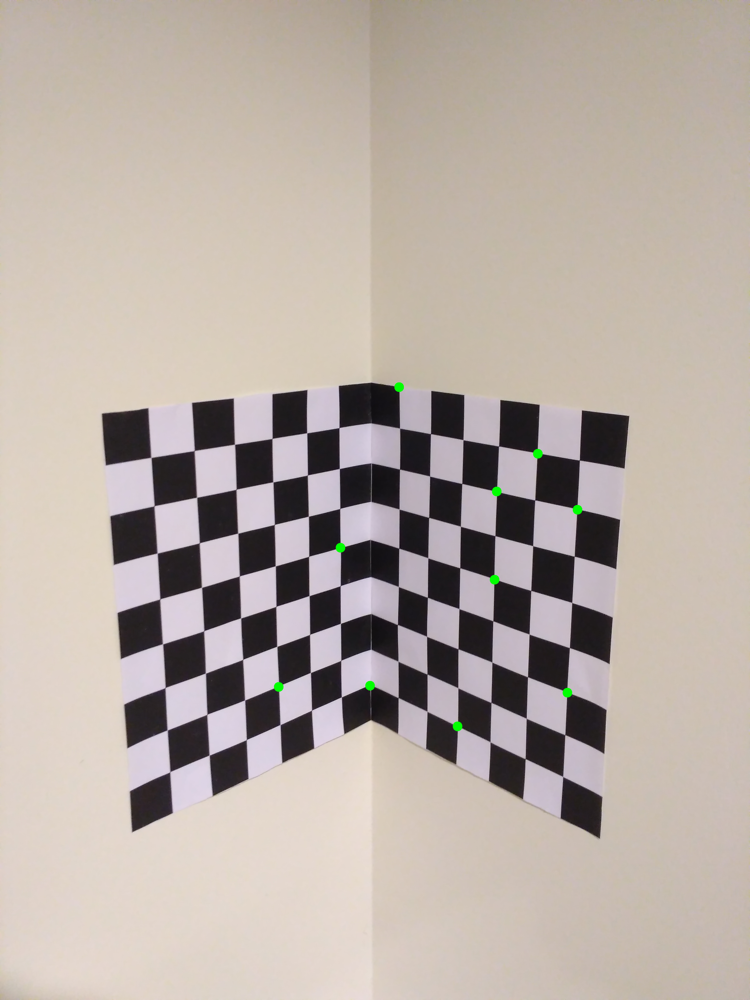

In [210]:
'''Q1 Part 1 - Detecting Corners'''

# Load the chessboard image
image = cv2.imread('./calib-object.jpg')
if image is None:
    print('Could not open or find the image')
    exit(0)

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)  # Convert the image to grayscale

# Parameters for corner detection
max_corners = 10        # Maximum number of corners to detect
quality_level = 0.01    # Quality level threshold
min_distance = 10       # Minimum distance between detected corners

# Detect corners using goodFeaturesToTrack
corners = cv2.goodFeaturesToTrack(gray, max_corners, quality_level, min_distance)

# Convert corners to integers
corners = np.int0(corners)

# Draw detected corners on the original image
for corner in corners:
    x, y = corner.ravel()
    cv2.circle(image, (x, y), 20, (0, 255, 0), -1)  # Draw a green circle at each corner

# Display the image with detected corners
# display_image(image, 'Detected Corners')
display(Image(data=cv2.imencode('.png', image)[1], width=display_width/5, height=display_height/5))

Q1 Part 2 : Camera Calibration

Here, I assume the wall has an angle of 90 degrees. I also use the bottom center of the chessboard, near the wall bend as the origin.

In [211]:
'''Q1 Part 2 - Camera Calibration'''
# get uv in image coordinates
uv = np.squeeze(corners)
uv = uv[np.lexsort((uv[:,1], uv[:,0]))]
# print(uv)

X = np.zeros((len(uv), 3))
X[0] = [6,  0,   4]
X[1] = [2,  0,  10]
X[2] = [0,  0,   2]
X[3] = [0,  2,  18]
X[4] = [0,  6,   2]
X[5] = [0,  8,  10]
X[6] = [0,  8,  14]
X[7] = [0,  10, 16]
X[8] = [0,  12,  6]
X[9] = [0,  12, 14]
# print(X)

# matrix G, which is the stacked matrix of the uv and X
G = np.zeros((2*len(uv), 12))
for i in range(len(uv)):
    G[2*i] = [X[i,0], X[i,1], X[i,2], 1, 0, 0, 0, 0, -uv[i,0]*X[i,0], -uv[i,0]*X[i,1], -uv[i,0]*X[i,2], -uv[i,0]]
    G[2*i+1] = [0, 0, 0, 0, X[i,0], X[i,1], X[i,2], 1, -uv[i,1]*X[i,0], -uv[i,1]*X[i,1], -uv[i,1]*X[i,2], -uv[i,1]]
# print(G)

# matrix P, which is the solution to the equation G*P = 0
U, S, V = np.linalg.svd(G)
P = V[-1]
P = P.reshape(3,4)
print('Matrix P:')
print(P)

# # matrix K, R, t, C
# K1, R1, t1, _, _, _, _ = cv2.decomposeProjectionMatrix(P)
# print('Matrix K:')
# print(K1)

# print('Matrix R:')
# print(R1)

# print('Matrix t:')
# print(t1/t1[-1])

def decompose_projection_matrix(P):
    M = P[:,:-1]

    # qr q==R , r == Kinv

    Rinv,Kinv = np.linalg.qr(np.linalg.inv(M))
    K = np.linalg.inv(Kinv)
    R = np.linalg.inv(Rinv)
    if K[2,2] < 0:
        K = -K
        # K[:,0] = -K[:,0]
        R = -R
        # R[0,:] = -R[0,:]

    # C = P[:,-1]*np.linalg.inv(R)*Kinv
    t = Kinv.dot(P[:,-1])
    C = np.linalg.inv(R).dot(t)
    return K, R, t, C

K, R, t, C = decompose_projection_matrix(P)

print('Matrix K:')
print(K)

print('Matrix R:')
print(R)

print('Matrix t:')
print(t)

print('Matrix C:')
print(C)


Matrix P:
[[-2.47225454e-02  9.23382709e-03 -2.30651575e-03  4.57125530e-01]
 [-8.07425143e-03 -5.00526763e-03 -2.53926824e-02  8.88594024e-01]
 [-5.41033599e-06 -4.44424774e-06 -1.44793509e-06  2.96779285e-04]]
Matrix K:
[[-2.28166378e-02  8.25838623e-04  1.34352841e-02]
 [ 0.00000000e+00  2.29940158e-02  1.43634884e-02]
 [ 0.00000000e+00  0.00000000e+00  7.14979647e-06]]
Matrix R:
[[ 0.64235062 -0.7645378  -0.05355023]
 [ 0.12154341  0.1706072  -0.97781408]
 [-0.75671189 -0.6215908  -0.20251417]]
Matrix t:
[ -4.86739964 -12.71562288 -41.50877391]
Matrix C:
[26.73810545 27.35340638 21.10028038]


Q1 Part 3 : Wireframe

Observation : We observe that the wireframe fits perfectly on the right side of the chessboard, but somehow the left side is not fitting properly.

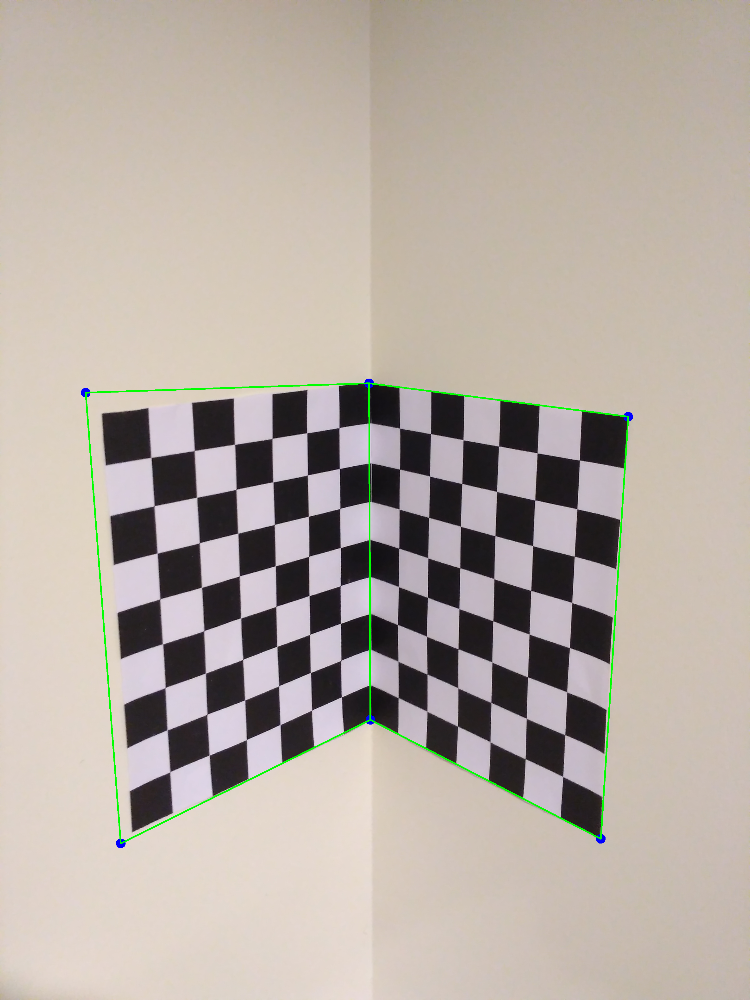

In [212]:
WF3d = np.array([[0, 0, 0, 1],
                [14, 0, 0, 1],
                [0, 14, 0, 1],
                [0, 14, 18, 1],
                [14, 0, 18, 1],
                [0, 0, 18, 1],])

WF3d = WF3d.T
WF2d = P.dot(WF3d)
WF2d = WF2d/WF2d[-1]
# print(WF2d)

# mark the points in the image and display
image = cv2.imread('./calib-object.jpg')
for i in range(WF2d.shape[1]):
    cv2.circle(image, (int(WF2d[0,i]), int(WF2d[1,i])), 20, (255, 0, 0), -1)  # Draw a red circle at each corner
# make straight lines between the points
cv2.line(image, (int(WF2d[0,0]), int(WF2d[1,0])), (int(WF2d[0,1]), int(WF2d[1,1])), (0, 255, 0), 5)
cv2.line(image, (int(WF2d[0,0]), int(WF2d[1,0])), (int(WF2d[0,2]), int(WF2d[1,2])), (0, 255, 0), 5)
cv2.line(image, (int(WF2d[0,1]), int(WF2d[1,1])), (int(WF2d[0,4]), int(WF2d[1,4])), (0, 255, 0), 5)
cv2.line(image, (int(WF2d[0,3]), int(WF2d[1,3])), (int(WF2d[0,5]), int(WF2d[1,5])), (0, 255, 0), 5)
cv2.line(image, (int(WF2d[0,4]), int(WF2d[1,4])), (int(WF2d[0,5]), int(WF2d[1,5])), (0, 255, 0), 5)
cv2.line(image, (int(WF2d[0,0]), int(WF2d[1,0])), (int(WF2d[0,5]), int(WF2d[1,5])), (0, 255, 0), 5)
cv2.line(image, (int(WF2d[0,3]), int(WF2d[1,3])), (int(WF2d[0,2]), int(WF2d[1,2])), (0, 255, 0), 5)

# display_image(image, 'Detected Corners')
display(Image(data=cv2.imencode('.png', image)[1], width=display_width/5, height=display_height/5))